# Image alignment

In this notebook, we will have to solve two image alignment problems: channel processing and face alignment.

# Image channels processing and alignment (7.5 points)

## Problem review

Sergey Prokudin-Gorsky was the first color photographer in Russia, who made the color portrait of Leo Tolstoy. Each of his photographs is three black-and-white photo plates, corresponding to red, green, and blue color channels. Currently, the collection of his pictures is situated in the U.S. Library of Congress, the altered versions have proliferated online. In this task, you should make a programme which will align the images from the Prokudin-Gorsky plates and learn the basic image processing methods.


In [1]:
%pylab inline
import matplotlib.pyplot as plt 
import numpy as np

Populating the interactive namespace from numpy and matplotlib


## Problem description

#### Input image loading

The input image is the set of 3 plates, corresponding to B, G, and R channels (top-down).

In [2]:
from PIL import Image
import matplotlib.image as mpimg
import os
    

def load_data(dir_name = 'plates'):
    images = []
    for filename in os.listdir(dir_name):
        img = matplotlib.pyplot.imread(os.path.join(dir_name,filename))
        img = img[:,:,1]
        if img is not None:
            images.append(img)
    return images

plates = load_data()

The dataset is a list of 2-dimensional arrays.

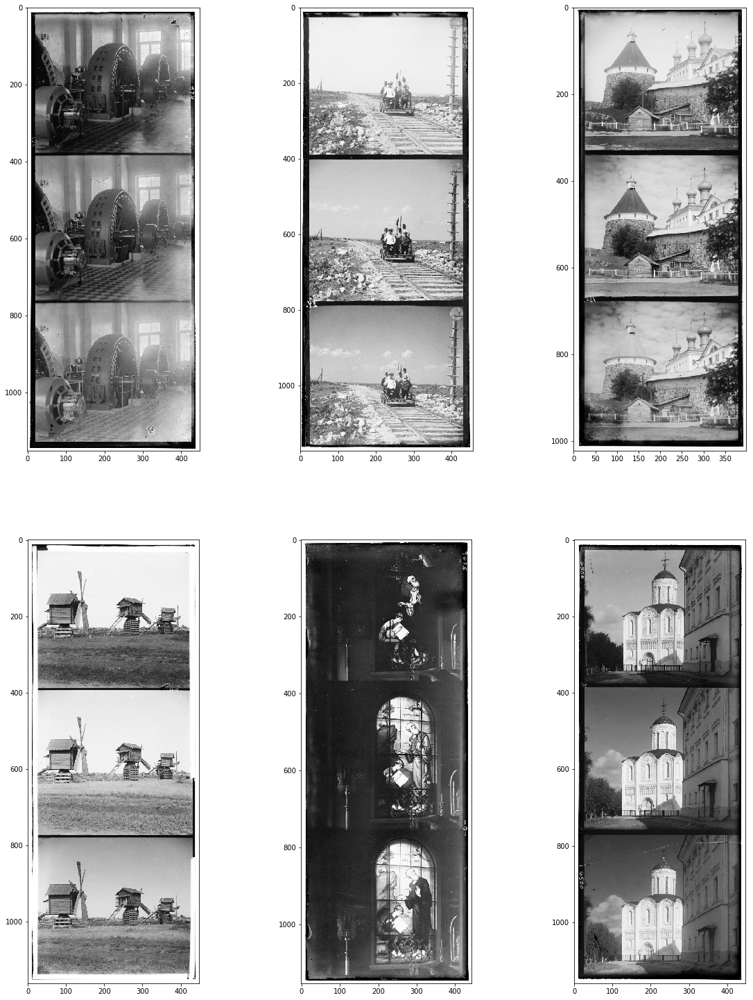

In [3]:
# The auxiliary function `visualize()` displays the images given as argument.
def visualize(imgs, format=None):
    plt.figure(figsize=(20, 40))
    for i, img in enumerate(imgs):
        if img.shape[0] == 3:
            img = img.transpose(1,2,0)
        plt_idx = i+1
        plt.subplot(3, 3, plt_idx)    
        plt.imshow(img, cmap=format)
    plt.show()

visualize(plates, 'gray')

#### The borders removal 
It is worth noting that there is a framing from all sides in most of the images. This framing can appreciably worsen the quality of channels alignment. Here, we find the borders on the plates using Canny edge detector, and crop the images according to these edges. The example of using Canny detector implemented in skimage library can be found [here](http://scikit-image.org/docs/dev/auto_examples/edges/plot_canny.html).<br>

The borders can be removed in the following way:
* Apply Canny edge detector to the image.
* Find the rows and columns of the frame pixels. 
For example, in case of upper bound we will search for the row in the neighborhood of the upper edge of the image (e.g. 5% of its height). For each row let us count the number of edge pixels (obtained using Canny detector) it contains. Having these number let us find two maximums among them. Two rows corresponding to these maximums are edge rows. As there are two color changes in the frame (firstly, from light scanner background to the dark tape and then from the tape to the image), we need the second maximum that is further from the image border. The row corresponding to this maximum is the crop border. In order not to find two neighboring peaks, non-maximum suppression should be implemented: the rows next to the first maximum are set to zero, and after that, the second maximum is searched for.

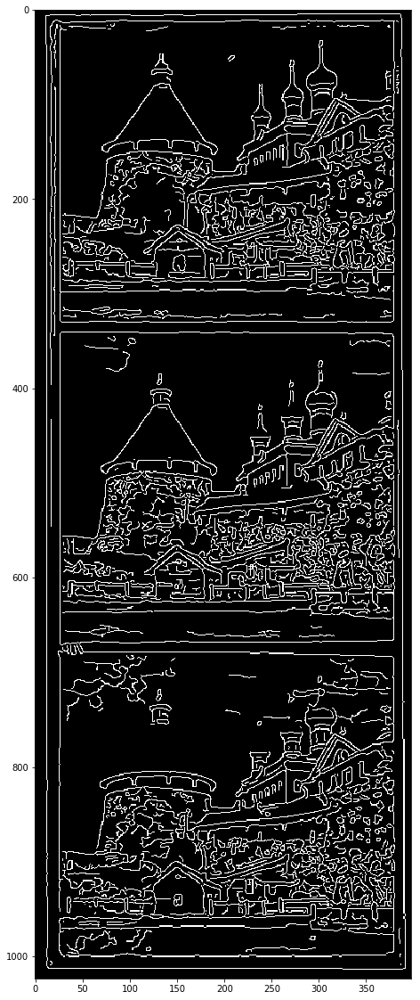

In [4]:
from skimage import feature
from skimage import io

edges = feature.canny(plates[2], sigma = 1.4)
fig, ax = subplots(figsize=(30, 20))
ax.imshow(edges, cmap='gray', interpolation='nearest')
#io.show()

<BarContainer object of 398 artists>

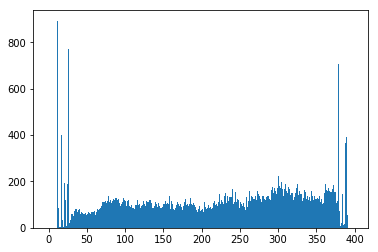

In [5]:
hist = np.sum(edges, axis=0)
plt.bar(range(len(hist)), hist, 1)

<BarContainer object of 1024 artists>

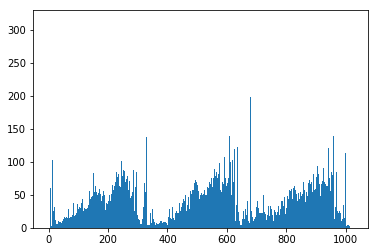

In [6]:
hist = np.sum(edges, axis=1)
plt.bar(range(len(hist)), hist, 1)

In [7]:
def removeBorder(img):
    limit = np.round(img.shape[1]/10)
    possible_borders = np.concatenate((np.arange(limit),np.arange(img.shape[1]-limit,img.shape[1])))
    edge = feature.canny(img, sigma = 1.4)
    
    ## remove vertical borders
    hist = np.sum(edge, axis=0)
    sort_hist = np.argsort(hist)
    top_values = sort_hist[-8:]
    possible_left = [x for x in top_values if x in np.arange(limit)]
    left = max(possible_left)
    possible_right = [x for x in top_values if x in np.arange(img.shape[1]-limit,img.shape[1])]
    right = min(possible_right)
    new_img = img[:,left:right]
    
    ## remove horizontal borders
    hist = np.sum(edge, axis=1)
    sort_hist = np.argsort(hist)
    top_values = sort_hist[-8:]
    possible_up = [x for x in top_values if x in np.arange(limit)]
    up = max(possible_up)
    possible_down = [x for x in top_values if x in np.arange(img.shape[0]-limit,img.shape[0])]
    down = min(possible_down)
    new_img = new_img[up:down,:]
    return new_img
    

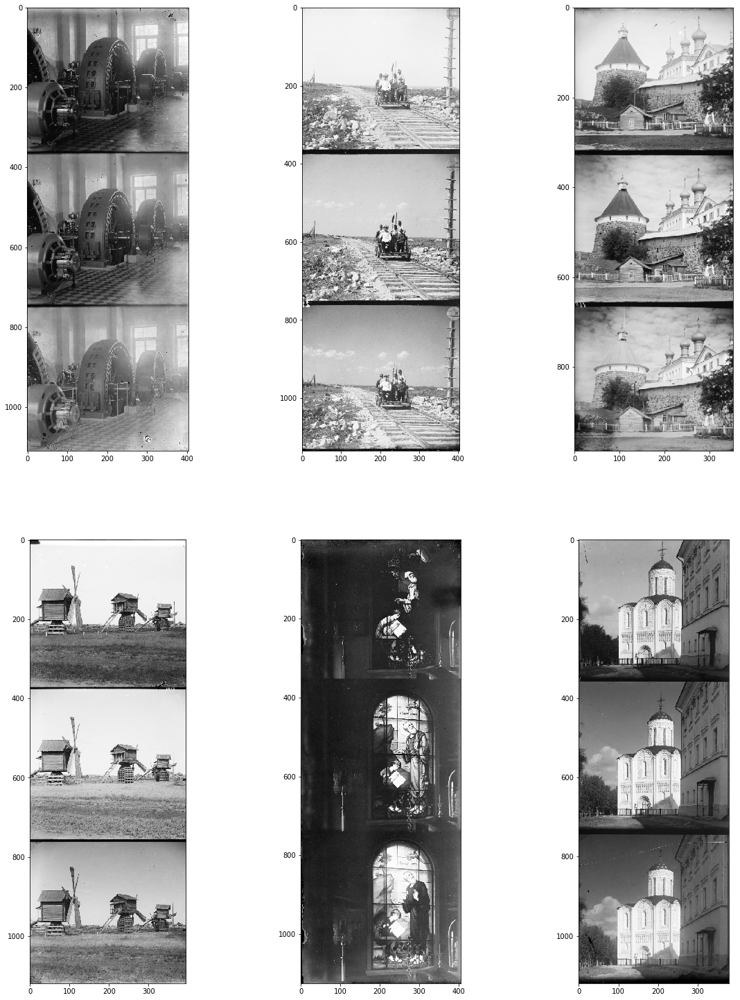

In [8]:
images_without_borders = []
for image in plates:
    images_without_borders.append(removeBorder(image))
visualize(images_without_borders, 'gray')

#### Canny detector implementation 
We can write your own implementation of Canny edge detector. <br>

Canny detection algorithm:
1. *Noise reduction.* To remove noise, the image is smoothed by Gaussian blur with the kernel of size $5 \times 5$ and $\sigma = 1.4$. Since the sum of the elements in the Gaussian kernel equals $1$, the kernel should be normalized before the convolution. <br><br>

2. *Calculating gradients.* When the image $I$ is smoothed, the derivatives $I_x$ and $I_y$ w.r.t. $x$ and $y$ are calculated. It can be implemented by convolving $I$ with Sobel kernels $K_x$ and $K_y$, respectively: 
$$ K_x = \begin{pmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{pmatrix}, K_y = \begin{pmatrix} 1 & 2 & 1 \\ 0 & 0 & 0 \\ -1 & -2 & -1 \end{pmatrix}. $$ 
Then, the magnitude $G$ and the slope $\theta$ of the gradient are calculated:
$$ |G| = \sqrt{I_x^2 + I_y^2}, $$
$$ \theta(x,y) = arctan\left(\frac{I_y}{I_x}\right)$$<br><br>

3. *Non-maximum suppression.* For each pixel find two neighbors (in the positive and negative gradient directions, supposing that each neighbor occupies the angle of $\pi /4$, and $0$ is the direction straight to the right). If the magnitude of the current pixel is greater than the magnitudes of the neighbors, nothing changes, otherwise, the magnitude of the current pixel is set to zero.<br><br>

4. *Double threshold.* The gradient magnitudes are compared with two specified threshold values, the first one is less than the second. The gradients that are smaller than the low threshold value are suppressed; the gradients higher than the high threshold value are marked as strong ones and the corresponding pixels are included in the final edge map. All the rest gradients are marked as weak ones and pixels corresponding to these gradients are considered in the next step.<br><br>

5. *Edge tracking by hysteresis.* Since a weak edge pixel caused from true edges will be connected to a strong edge pixel, pixel $w$ with weak gradient is marked as edge and included in the final edge map if and only if it is involved in the same blob (connected component) as some pixel $s$ with strong gradient. In other words, there should be a chain of neighbor weak pixels connecting $w$ and $s$ (the neighbors are 8 pixels around the considered one). You are welcome to make up and implement an algorithm that finds all the connected components of the gradient map considering each pixel only once.  After that, you can decide which pixels will be included in the final edge map (this algorithm should be single-pass, as well).

In [9]:
import scipy.ndimage as ndi
import scipy
import numpy
import math

In [10]:
def Canny_detector(img):
    gradx = img                       
    grady = img  

    sobel_x = [[-1,0,1],
               [-2,0,2],
               [-1,0,1]]
    sobel_y = [[1,2,1],
               [0,0,0],
               [-1,-2,-1]]

    width = img.shape[1]
    height = img.shape[0]
    for x in range(1, height-1):
        for y in range(1, width-1):
            px = (sobel_x[0][0] * gradx[x-1][y-1]) + (sobel_x[1][0] * gradx[x][y-1]) + \
                 (sobel_x[2][0] * gradx[x+1][y-1]) + (sobel_x[0][1] * gradx[x-1][y]) + \
                 (sobel_x[1][1] * gradx[x][y]) + (sobel_x[2][1] * gradx[x+1][y]) + \
                 (sobel_x[2][0] * gradx[x-1][y+1]) + (sobel_x[1][2] * gradx[x][y+1]) + \
                 (sobel_x[2][2] * gradx[x+1][y+1])

            py = (sobel_y[0][0] * grady[x-1][y-1]) + (sobel_y[1][0] * grady[x][y-1]) + \
                 (sobel_y[2][0] * grady[x+1][y-1]) + (sobel_y[0][1] * grady[x-1][y]) + \
                 (sobel_y[1][1] * grady[x][y]) + (sobel_y[2][1] * grady[x+1][y]) + \
                 (sobel_y[2][0] * grady[x-1][y+1]) + (sobel_y[1][2] * grady[x][y+1]) + \
                 (sobel_y[2][2] * grady[x+1][y+1])
            gradx[x][y] = px
            grady[x][y] = py
    sobeloutmag = scipy.hypot(gradx, grady)
    soble = feature.canny(img, sigma = 1.4)
    sobeloutdir = scipy.arctan2(grady, gradx)
    new_image = soble
    return new_image


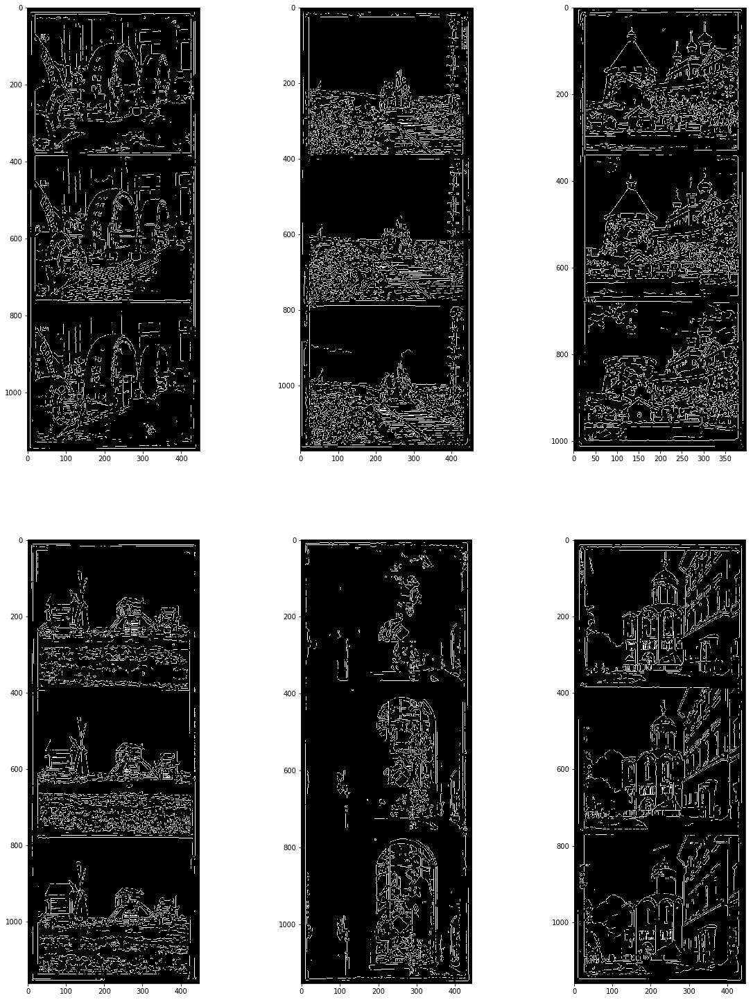

In [11]:
canny_imgs = []
for img in plates:
    canny_img = Canny_detector(img)
    canny_imgs.append(canny_img)
visualize(canny_imgs, 'gray')

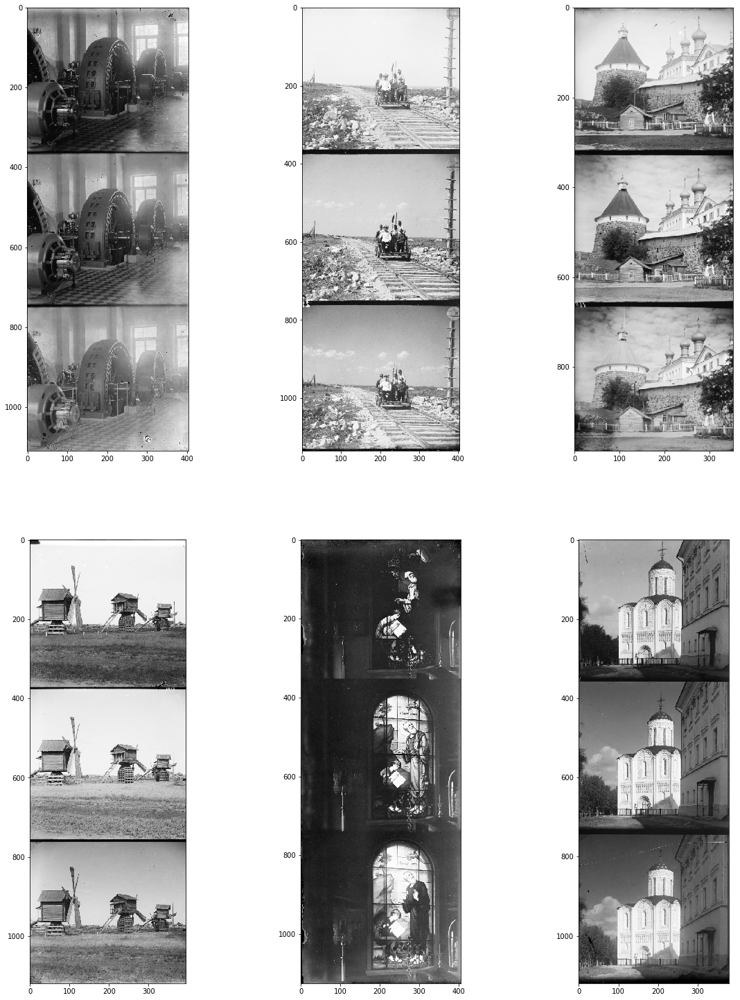

In [14]:
cropped_imgs = []
#crop borders
for i, img in enumerate(plates):
    cropped_imgs.append(removeBorder(img))

visualize(cropped_imgs, 'gray')

#### Channels separation

The next step is to separate the image into three channels (B, G, R) and make one colored picture. To get channels, we can divide each plate into three equal parts.

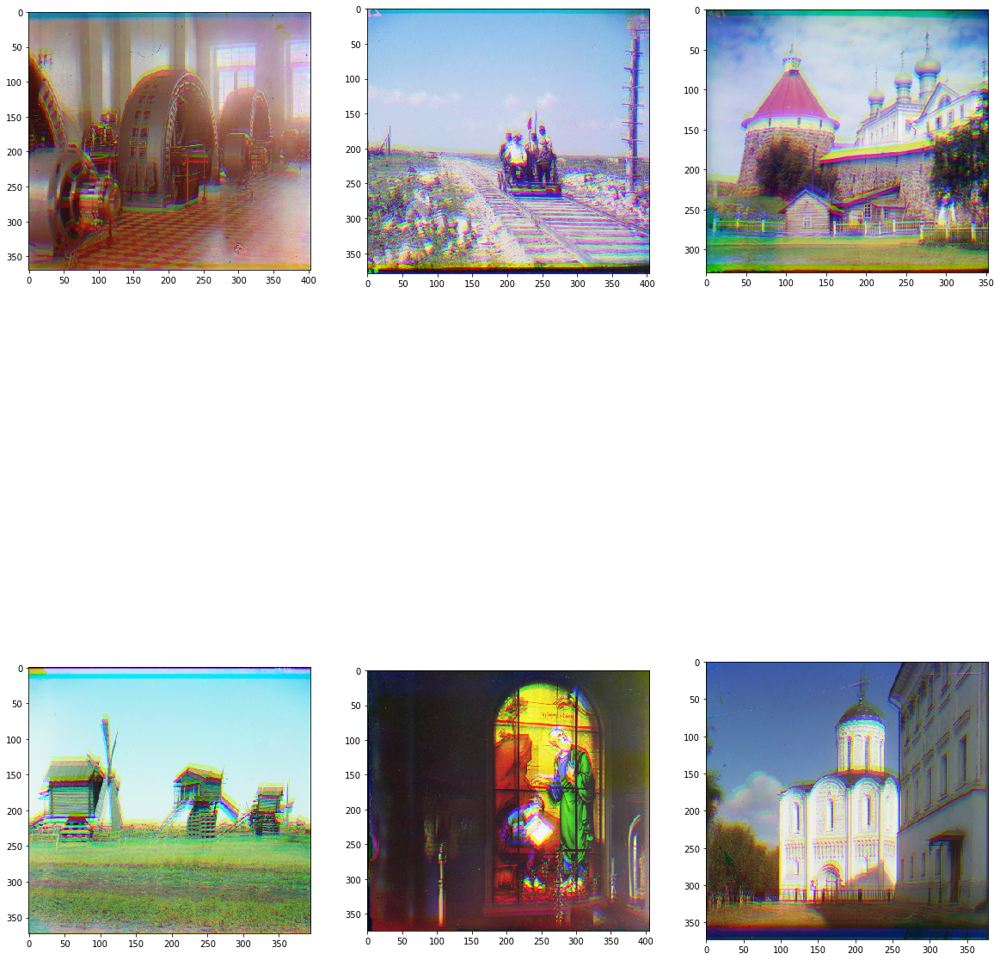

In [15]:
def impose_components(img):
    size = round(img.shape[0]/3)
    index = size
    image_1 = img[:index,:]
    index = index + 1
    image_2 = img[index:index+size,:]
    index = index + size + 1
    image_3 = img[-size:,:]
    colored_image = np.zeros((image_1.shape[0],image_1.shape[1],3))
    colored_image[:,:,0] = image_3
    colored_image[:,:,1] = image_2
    colored_image[:,:,2] = image_1
    return colored_image


rgb_imgs = []
for cropped_img in cropped_imgs:
    rgb_img = impose_components(cropped_img)
    rgb_imgs.append(rgb_img)

visualize(rgb_imgs)

#### Search for the best shift for channel alignment

In order to align two images, we will shift one image relative to another within some limits (e.g. from $-15$ to $15$ pixels). For each shift, we can calculate some metrics in the overlap of the images. Depending on the metrics, the best shift is the one the metrics achieves the greatest or the smallest value for. We must implement two metrics and choose the one that allows to obtain the better alignment quality:

* *Mean squared error (MSE):*<br><br>
$$ MSE(I_1, I_2) = \dfrac{1}{w * h}\sum_{x,y}(I_1(x,y)-I_2(x,y))^2, $$<br> where *w, h* are width and height of the images, respectively. To find the optimal shift we should find the minimum MSE over all the shift values.
    <br><br>
* *Normalized cross-correlation (CC):*<br><br>
    $$
    I_1 \ast I_2 = \dfrac{\sum_{x,y}I_1(x,y)I_2(x,y)}{\sum_{x,y}I_1(x,y)\sum_{x,y}I_2(x,y)}.
    $$<br>
    To find the optimal shift we should find the maximum CC over all the shift values.

In [17]:
def mse(X, Y):
    """ Your implementation """
    mse = 0
    w = X.shape[0]
    h = X.shape[1]
    mse += np.sum((X-Y)**2)
    mse = mse/(w*h)
    return mse

def cor(X, Y):
    score = 0
    score += np.sum(np.multiply(X,Y))
    score = score/(np.sum(X)*np.sum(Y))
    """ Your implementation """     
    return score

In [18]:
def shiftImage(image,value):
    new_image = np.roll(image,value,axis = 0)
    return new_image

In [19]:
def get_best_shift(channel1, channel2):
    """ Your implementation """     
    shifts = np.arange(-15,16)
    mse_scores = []
    cor_scores = []
    for shift in shifts:
        new_channel = shiftImage(channel2,shift)
        score1 = mse(channel1,new_channel)
        score2 = cor(channel1,new_channel)
        mse_scores.append(score1)
        cor_scores.append(score2)
    best_shift = shifts[np.argmin(mse_scores)]
    return best_shift, shiftImage(channel2,best_shift)


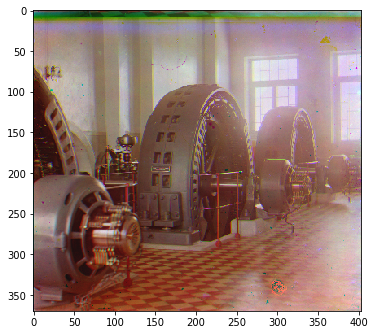

In [20]:
def get_best_image(image):
    image_1 = image[:,:,0]
    image_2 = image[:,:,1]
    image_3 = image[:,:,2]
    shift_1_2, new_image2 = get_best_shift(image_1,image_2)
    shift_2_3,new_image3 = get_best_shift(new_image2,image_3)
    colored_image = np.zeros((image_1.shape[0],image_1.shape[1],3))
    colored_image[:,:,0] = image_1
    colored_image[:,:,1] = new_image2
    colored_image[:,:,2] = new_image3
    return colored_image
img = get_best_image(rgb_imgs[0])
visualize([img])

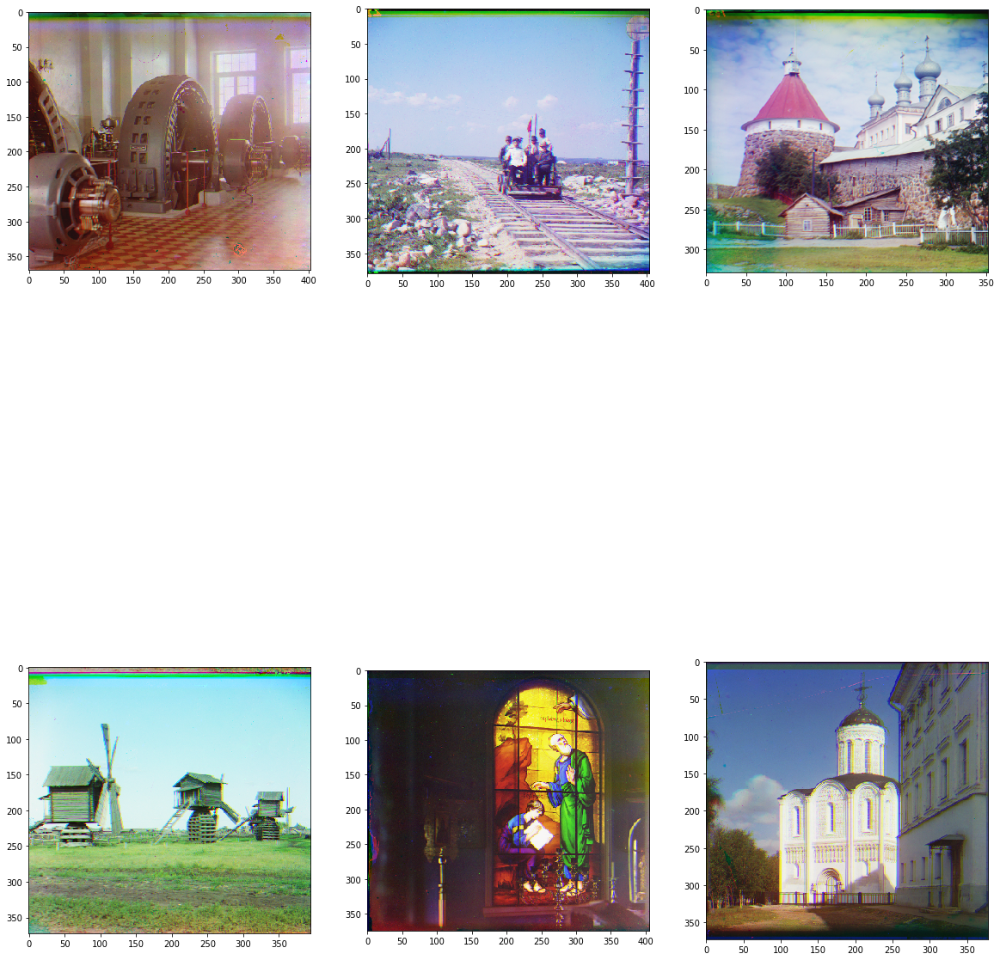

In [21]:
final_imgs = []
for img in rgb_imgs:
    final_img = get_best_image(img)
    final_imgs.append(final_img)

visualize(final_imgs)

# Face Alignment 

Now we try to implement face normalization and alignment. Most of the face images deceptively seem to be aligned, but since many face recognition algorithms are very sensitive to shifts and rotations, we need not only to find a face on the image but also normalize it. Besides, the neural networks usually used for recognition have fixed input size, so, the normalized face images should be resized as well.

There are six images of faces you have to normalize. In addition, you have the coordinates of the eyes in each of the pictures. You have to rotate the image so that the eyes are on the same height, crop the square box containing the face and transform it to the size $224\times 224.$ The eyes should be located symmetrically and in the middle of the image (on the height).

In [22]:
import pickle

def load_faces_and_eyes(dir_name = 'faces_imgs', eye_path = './eyes.pickle'):
    images = dict()
    eyes = []
    for i,filename in enumerate(os.listdir(dir_name)):
        img = matplotlib.pyplot.imread(os.path.join(dir_name,filename))
        if img is not None:
            images[i] = img
    with (open(eye_path, "rb")) as openfile:
        while True:
            try:
                eyes.append(pickle.load(openfile))
            except EOFError:
                break
    return images, eyes
    
    
faces, eyes = load_faces_and_eyes()

In [23]:
eyes

[{'2.jpg': [(108, 92), (145, 88)],
  '6.jpg': [(169, 133), (222, 126)],
  '4.jpg': [(146, 174), (211, 180)],
  '5.jpg': [(230, 121), (279, 114)],
  '3.jpg': [(173, 201), (246, 193)],
  '1.jpg': [(104, 132), (152, 124)]}]

In [24]:
eye = dict()
for key in eyes[0].keys():
    new_key = int(key[0])-1
    eye[new_key] = eyes[0][key]
eye

{1: [(108, 92), (145, 88)],
 5: [(169, 133), (222, 126)],
 3: [(146, 174), (211, 180)],
 4: [(230, 121), (279, 114)],
 2: [(173, 201), (246, 193)],
 0: [(104, 132), (152, 124)]}

Here is how the input images look like:

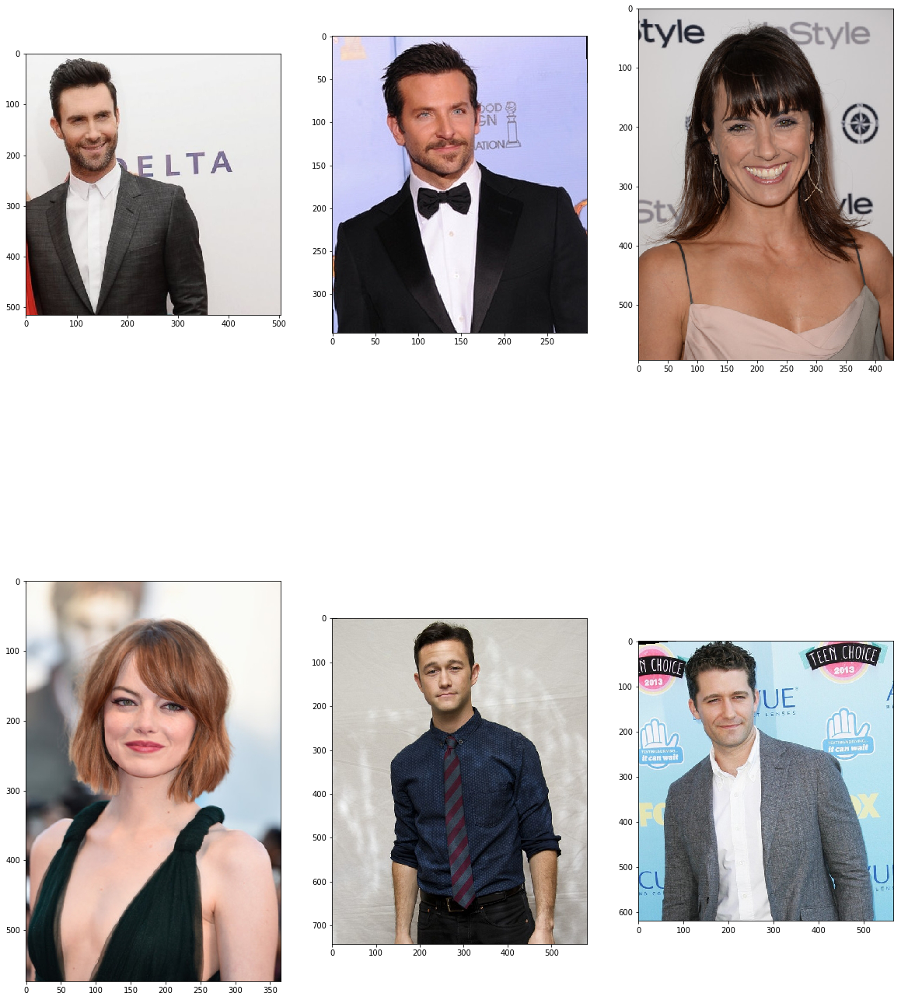

In [25]:
visualize(faces.values())

In [26]:
import math
def getAngle(eye):
    signe = 1
    left_x = eye[0][0]
    left_y = eye[0][1]
    right_x = eye[1][0]
    right_y = eye[1][1]
    line1 = np.zeros(2)
    line1[0] = left_x - right_x
    line1[1] = left_y - right_y
    line2 = np.zeros(2)
    line2[0] = 1
    line2[1] = 0
    inner_product = line1[0]*line2[0] + line1[1]*line2[1]
    len1 = math.hypot(line1[0], line1[1])
    len2 = math.hypot(line2[0], line2[1])
    if(right_y<left_y):
        signe = -1
    return signe*np.round(math.acos(inner_product/(len1*len2)),2)

getAngle(eyes[0]['5.jpg'])

-3.0

In [27]:
def rotateImage(i):
    angle = getAngle(eye[i])
    new_image = scipy.ndimage.interpolation.rotate(faces[i],angle)
    return new_image,angle


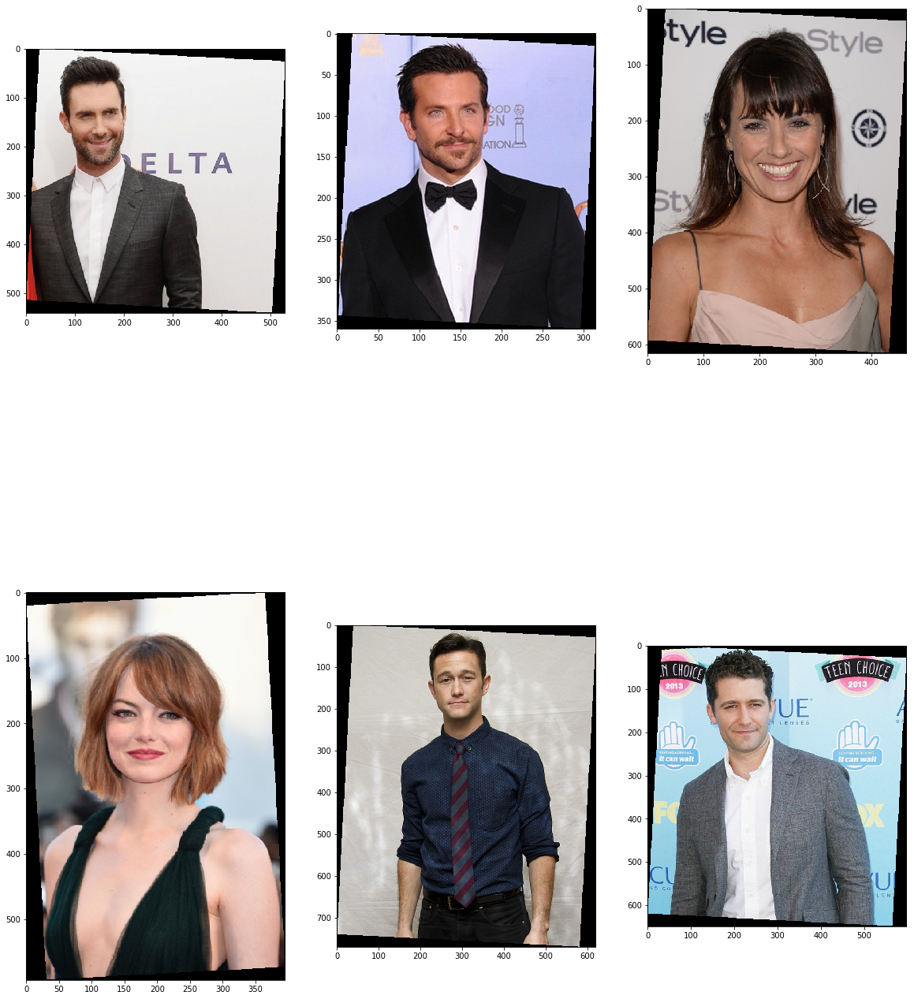

In [28]:
rotate_imgs = []
angles = []
for i in range(6):
    img,angle = rotateImage(i)
    rotate_imgs.append(img)
    angles.append(angle)
visualize(rotate_imgs)

In [29]:
def rotate(origin, point, angle):
    """
    Rotate a point counterclockwise by a given angle around a given origin.

    The angle should be given in radians.
    """
    angle = math.radians(angle)
    ox, oy = origin
    px, py = point

    qx = ox + math.cos(angle) * (px - ox) - math.sin(angle) * (py - oy)
    qy = oy + math.sin(angle) * (px - ox) + math.cos(angle) * (py - oy)
    return qx, qy


In [30]:
def getCoordinatesEyes(eye,angle):
    left = eye[0]
    right = eye[1]
    origin = left
    point = right
    if(left[1] > right[1]):
        origin = right
        point = left
    x,y = rotate(origin,point,angle)
    x = round(x)
    y = round(y)
    if(x<origin[0]):
        return (x,origin[1]),(origin[0],origin[1])
    else:
        return (origin[0],origin[1]),(x,origin[1])
    

In [31]:
new_eyes = dict()
for i in range(6):
    new_eyes[i] = getCoordinatesEyes(eye[i],angles[i])

We now execute the following steps:
1. Find the angle between the segment connecting two eyes and horizontal line;
2. Rotate the image;
3. Find the coordinates of the eyes on the rotated image
4. Find the width and height of the box containing the face depending on the eyes coordinates
5. Crop the box and resize it to $224\times224$

In [32]:
def transform_face(image, eyes):
    left = eyes[0]
    right = eyes[1]
    distance = right[0] - left[0]
    if(distance%2 != 0):
        distance = distance + 1
        margin = (224-distance)/2
        begin = left[0] - margin
        end = right[0] + margin+1
    else:
        distance = distance
        margin = (224-distance)/2
        begin = left[0] - margin
        end = right[0] + margin 
        
    up = round(left[1]*0.35)
    down = up + 223
    begin = int(begin)
    end = int(end)
    up = int(up)
    down = int(down)
    image = image[up:down,begin:end,:]
    return image

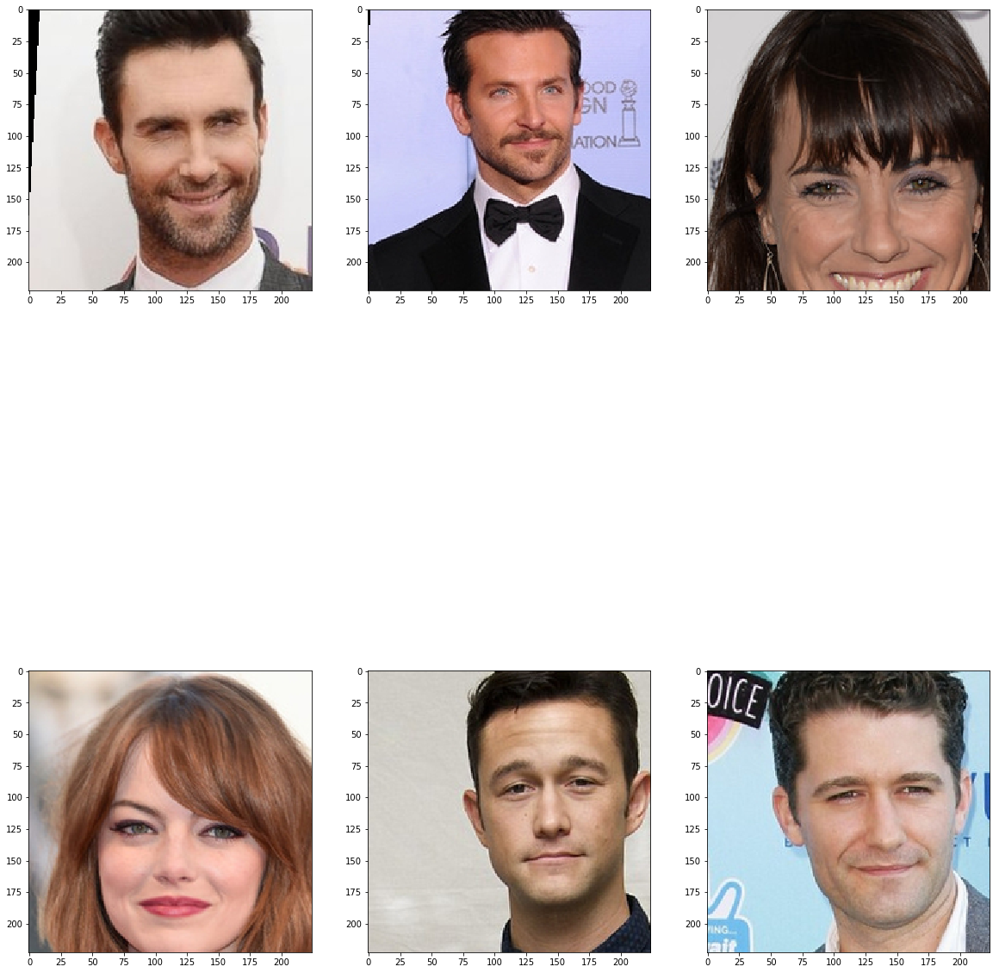

In [33]:
transformed_imgs = []
for i in range(6):
    img = rotate_imgs[i]
    eye = new_eyes[i]
    transformed = transform_face(img, eye)
    transformed_imgs.append(transformed)
    
visualize(transformed_imgs)